In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, auc
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
import h3
from sklearn.base import clone
from itertools import product
import copy

In [9]:
!pip freeze | grep -v '@ file://' > /Users/dmitrystarukhin/final_diploma_mipt_sumgf/requirements.txt

In [2]:
df = pd.read_csv('/Users/dmitrystarukhin/final_diploma_mipt_sumgf/london/data/final_datasets/clean_reduced_dataset_london.csv')

будем разделять данные с 0 в таргете на две группы: те что похожи и не похожи на данные с 1 в таргете

In [3]:
df_has_chargers = df[df['сharger_number'] != 0]
df_no_chargers = df[df['сharger_number'] == 0]

In [4]:
stats_has_chargers = df_has_chargers.describe().transpose()
stats_has_chargers

,count,mean,std,min,25%,50%,75%,max
bicycle_amenities,325.0,4.923077e-01,1.662245e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,1.100000e+01
bike_amenities,325.0,4.615385e-01,2.656676e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,3.500000e+01
children_amenity,325.0,1.723077e-01,4.659743e-01,0.000000,0.000000,0.000000e+00,0.000000e+00,3.000000e+00
food_amenities,325.0,7.735385e+00,2.196976e+01,0.000000,0.000000,1.000000e+00,5.000000e+00,2.880000e+02
health_amenity,325.0,9.446154e-01,2.511088e+00,0.000000,0.000000,0.000000e+00,1.000000e+00,2.900000e+01
home_amenities,325.0,1.230769e-01,5.640378e-01,0.000000,0.000000,0.000000e+00,0.000000e+00,7.000000e+00
infrastructure_amenities,325.0,2.000000e-01,7.895928e-01,0.000000,0.000000,0.000000e+00,0.000000e+00,7.000000e+00
leisure_amenities,325.0,4.092308e-01,1.595298e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,2.300000e+01
other_amenities,325.0,3.212000e+01,6.019373e+01,0.000000,1.000000,1.000000e+01,3.200000e+01,5.020000e+02
pet_amenity,325.0,5.846154e-02,2.599218e-01,0.000000,0.000000,0.000000e+00,0.000000e+00,2.000000e+00


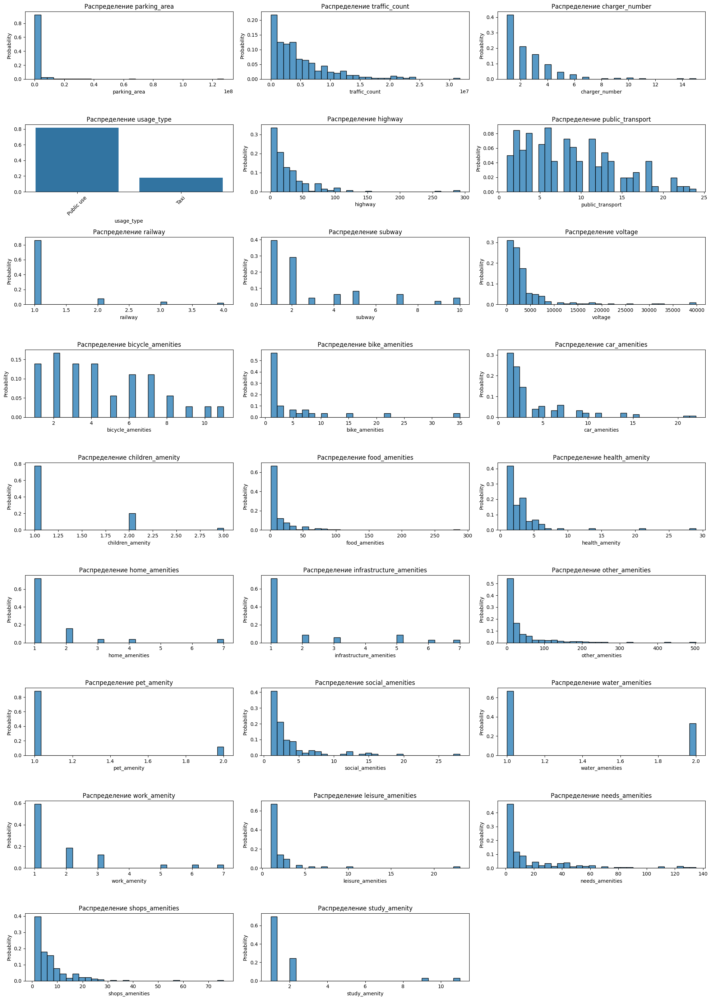

In [5]:
columns_to_plot = [
    'parking_area', 'traffic_count', 'сharger_number', 'usage_type',
       'highway', 'public_transport', 'railway', 'subway', 'voltage',
       'bicycle_amenities', 'bike_amenities',
       'car_amenities', 'children_amenity', 'food_amenities', 'health_amenity',
       'home_amenities', 'infrastructure_amenities', 'other_amenities',
       'pet_amenity', 'social_amenities',
       'water_amenities', 'work_amenity',
       'leisure_amenities', 'needs_amenities', 'shops_amenities',
       'study_amenity'

]

plt.figure(figsize=(20, 40))

for i, col in enumerate(columns_to_plot, 1):
    plt.subplot(13, 3, i)
    
    if col == 'usage_type':
        usage_counts = df_has_chargers[df_has_chargers[col] != 'nothing'][col].value_counts(normalize=True) 
        sns.barplot(x=usage_counts.index, y=usage_counts.values)
        plt.xticks(rotation=45)
    else:
        sns.histplot(df_has_chargers[df_has_chargers[col] != 0][col], bins=30, stat="probability")

    plt.title(f"Распределение {col}")
    plt.xlabel(col)

plt.tight_layout()
plt.show()

In [6]:
def calculate_confusion_stats(y_true, y_pred):
    tp = np.sum((y_true == 1) & (y_pred == 1))
    fp = np.sum((y_true == 0) & (y_pred == 1))
    tn = np.sum((y_true == 0) & (y_pred == 0))
    fn = np.sum((y_true == 1) & (y_pred == 0))
    return tp, tn, fp, fn
    
def micro_averaged_metrics(y_true, y_pred):
    tp, tn, fp, fn = calculate_confusion_stats(y_true, y_pred)
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
    
    return precision, recall, f1
    
def calculate_auc_stats(y_true, y_proba):
    thresholds = np.linspace(0, 1, 101)
    tpr_list = []
    fpr_list = []
    
    for thresh in thresholds:
        y_pred = (y_proba >= thresh).astype(int)
        tp, tn, fp, fn = calculate_confusion_stats(y_true, y_pred)
        
        tpr = tp / (tp + fn) if (tp + fn) > 0 else 0
        fpr = fp / (fp + tn) if (fp + tn) > 0 else 0
        
        tpr_list.append(tpr)
        fpr_list.append(fpr)
    return np.array(tpr_list), np.array(fpr_list)
    
def plot_roc_curve(fpr, tpr):
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, 
             label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

def get_report(y_true, y_pred, y_proba):
    precision, recall, f1 = micro_averaged_metrics(y_true, y_pred)
    tpr, fpr = calculate_auc_stats(y_true, y_proba)
    print(f'precision = {precision}')
    print(f'recall = {recall}')
    print(f'f1 = {f1}')
    plot_roc_curve(fpr, tpr)

In [7]:
def get_hex_neighbors(h3_index):
    return h3.grid_disk(h3_index, k=1)[1:] 

def generate_dataset(X, y, h3_indices):
    X = X.reset_index(drop=True).copy()
    y = y.reset_index(drop=True).copy()
    h3_indices = h3_indices.reset_index(drop=True).copy()
    
    selected_indices = []
    remaining_indices = set(range(len(X)))
    
    while remaining_indices:
        idx = np.random.choice(list(remaining_indices))
        selected_indices.append(idx)
        
        current_h3 = h3_indices.iloc[idx]
        neighbors = []
        for i in remaining_indices:
            if (h3_indices.iloc[i] in get_hex_neighbors(current_h3)) and (y.iloc[i] == 0):
                neighbors.append(i)
                
        remaining_indices -= {idx, *neighbors}
    
    X_train = X.iloc[selected_indices]
    y_train = y.iloc[selected_indices]
    
    return X_train, y_train

In [8]:
def find_best_model(
    model,
    X_full_train,
    y_full_train,
    param_grid,
    generate_dataset=None,
    h3_indices_train=None,
):
    if generate_dataset:
        X_train, y_train = generate_dataset(X_full_train, y_full_train, h3_indices_train)
    else:
        X_train, y_train = X_full_train, y_full_train

    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    grid_search = GridSearchCV(
        model,
        param_grid,
        cv=skf,
        scoring='f1',
        n_jobs=-1,
        verbose=1
    )
    grid_search.fit(X_train, y_train)
    best_model = clone(grid_search.best_estimator_)
    print(f"Best parameters: {grid_search.best_params_}")
    print()
    return best_model

In [9]:
def train_model(
    model,
    X_full_train,
    y_full_train,
    stratification,
    generate_dataset=None,
    h3_indices_train=None,
):
    if generate_dataset:
        X_train, y_train = generate_dataset(X_full_train, y_full_train, h3_indices_train)
    else:
        X_train, y_train = X_full_train, y_full_train

    skf = stratification
    all_y_true = []
    all_y_pred = []
    all_y_proba = []

    for train_idx, val_idx in skf.split(X_train, y_train):
        X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
        
        model.fit(X_tr, y_tr)
        
        y_pred = model.predict(X_val)
        y_proba = model.predict_proba(X_val)[:, 1]
        
        all_y_true.extend(y_val)
        all_y_pred.extend(y_pred)
        all_y_proba.extend(y_proba)
        
    print('Результаты полученные на валидационной выборке')
    get_report(np.array(all_y_true), np.array(all_y_pred), np.array(all_y_proba))
    
    return model

In [10]:
def evaluate_model(
    model,
    X_test,
    y_test,
):
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1]
    
    precision, recall, f1 = micro_averaged_metrics(y_test, y_pred)
    tpr, fpr = calculate_auc_stats(y_test, y_proba)
    
    print('Результаты полученные на тестовой выборке')
    get_report(y_test, y_pred, y_proba)

In [11]:
relevant_columns = [
    'parking_area', 'traffic_count',
       'highway', 'public_transport', 'railway', 'subway', 'voltage',
       'bicycle_amenities', 'bike_amenities',
       'car_amenities', 'children_amenity', 'food_amenities', 'health_amenity',
       'home_amenities', 'infrastructure_amenities', 'other_amenities',
       'pet_amenity', 'social_amenities',
       'water_amenities', 'work_amenity',
       'leisure_amenities', 'needs_amenities', 'shops_amenities',
       'study_amenity'

]

df = pd.read_csv('/Users/dmitrystarukhin/final_diploma_mipt_sumgf/london/data/final_datasets/clean_reduced_dataset_london.csv')
df_has_chargers = df[df['сharger_number'] != 0]
df_no_chargers = df[df['сharger_number'] == 0]

mean_has_chargers = df_has_chargers[relevant_columns].mean()

similarities = cosine_similarity(
    df_no_chargers[relevant_columns],
    mean_has_chargers.values.reshape(1, -1)
).flatten()

threshold = np.percentile(similarities, 75)

group_a = df_no_chargers[similarities >= threshold] #похожие на места с зарядками
group_b = df_no_chargers[similarities < threshold]  #непохожие на места с зарядками

print(f'group_a.shape={group_a.shape}, group_b.shape={group_a.shape}')

train_df = pd.concat([group_b, df_has_chargers])
X = train_df[relevant_columns]
y = train_df['сharger_number'].apply(lambda x: 1 if x > 0 else 0)  # бинарная классификация
h3_indices = train_df['h3_index']
X_predict = group_a[relevant_columns]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

group_a.shape=(541, 32), group_b.shape=(541, 32)


Обучим случайный классификатор как бейзлайн

precision = 0.13333333333333333
recall = 0.48148148148148145
f1 = 0.2088353413654618


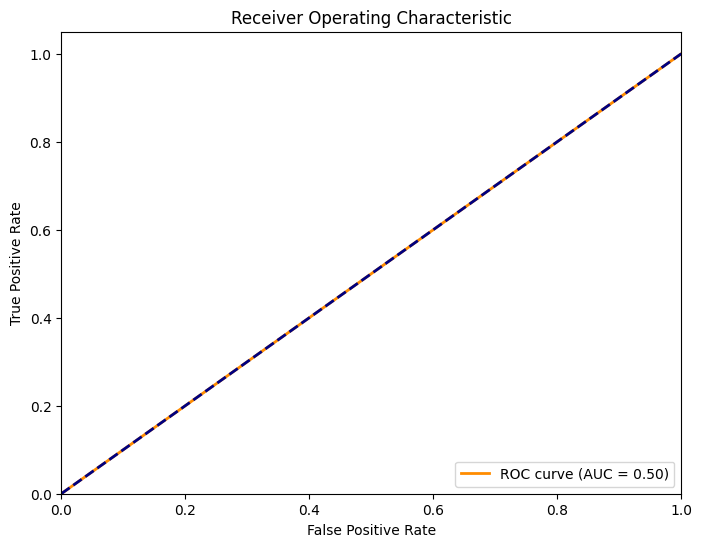

In [12]:
# бейзлайн
baseline_model = DummyClassifier(strategy='uniform', random_state=42)
baseline_model.fit(X_train, y_train)

y_pred = baseline_model.predict(X_test)
y_pred_proba = baseline_model.predict_proba(X_test)[:, 1]
get_report(y_test, y_pred, y_pred_proba)

обучаю три модели: RandomForest, Catboost, XGBoost.
Делаю так: использую GridSearch для поиска гиперпарметров, затем обучаю лучшую модель с помощью кросс-валидации, далее смотрб результаты на трейне и на тесте.

Самое главное, коеретно в этой вариации я делаю отбор тренировочной выбокри, а именно: я беру рандомную точку в качестве трейна и не беру ее соседей (их 6 штук. Так делаю и на выборе самой лучшей модели и на тренировке)

Fitting 5 folds for each of 12000 candidates, totalling 60000 fits
Best parameters: {'class_weight': 'balanced', 'max_depth': 15, 'max_features': 0.8, 'min_samples_leaf': 3, 'min_samples_split': 2, 'n_estimators': 20}

Результаты полученные на валидационной выборке
precision = 0.7044534412955465
recall = 0.6420664206642066
f1 = 0.6718146718146718


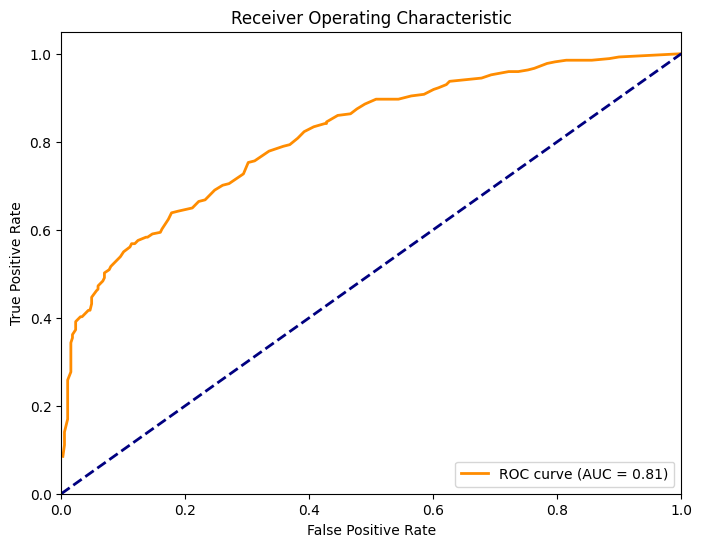

Результаты полученные на тестовой выборке
precision = 0.4891304347826087
recall = 0.8333333333333334
f1 = 0.6164383561643836


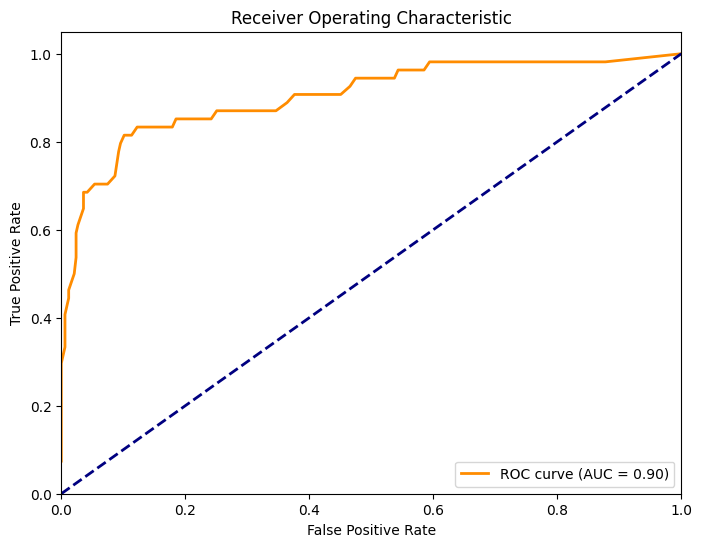

In [13]:
basic_model = RandomForestClassifier(
    random_state=42,
    n_estimators=100,          
    max_depth=None,            
    min_samples_split=2,       
    min_samples_leaf=1,       
    class_weight=None,         
    max_features='sqrt'       
)

param_grid = {
    'n_estimators': [3, 5, 10, 20, 50, 100, 200, 300, 400, 500],       
    'max_depth': [1, 5, 10, 15, 20, 25],       
    'min_samples_split': [2, 3, 5, 7, 10],   
    'min_samples_leaf': [1, 2, 3, 4],        
    'class_weight': ['balanced', None],   
    'max_features': ['sqrt', 0.5, 0.7, 0.8, 0.9]         
}


stratification = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
best_model = find_best_model(
    model=basic_model,
    X_full_train=X_train,
    y_full_train=y_train,
    param_grid=param_grid,
    generate_dataset=generate_dataset,
    h3_indices_train=train_df['h3_index'],
)

train_model(
    best_model,
    X_full_train=X_train,
    y_full_train=y_train,
    stratification=stratification,
    generate_dataset=generate_dataset,
    h3_indices_train=train_df['h3_index'],
)

evaluate_model(
    best_model,
    X_test=X_test,
    y_test=y_test,
)

Fitting 5 folds for each of 2880 candidates, totalling 14400 fits


/Users/dmitrystarukhin/final_diploma_mipt_sumgf/diploma_env/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best parameters: {'border_count': 64, 'depth': 10, 'grow_policy': 'SymmetricTree', 'iterations': 100, 'l2_leaf_reg': 5, 'learning_rate': 0.1, 'scale_pos_weight': 3}

Результаты полученные на валидационной выборке
precision = 0.6743421052631579
recall = 0.7564575645756457
f1 = 0.7130434782608696


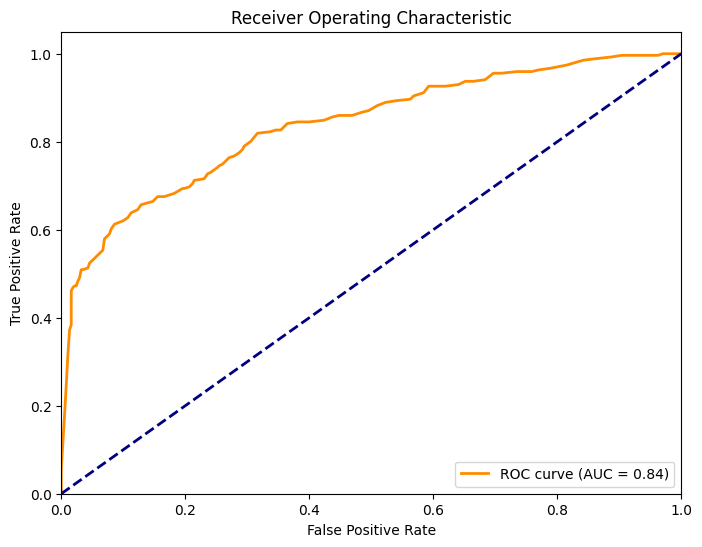

Результаты полученные на тестовой выборке
precision = 0.3333333333333333
recall = 0.8703703703703703
f1 = 0.48205128205128195


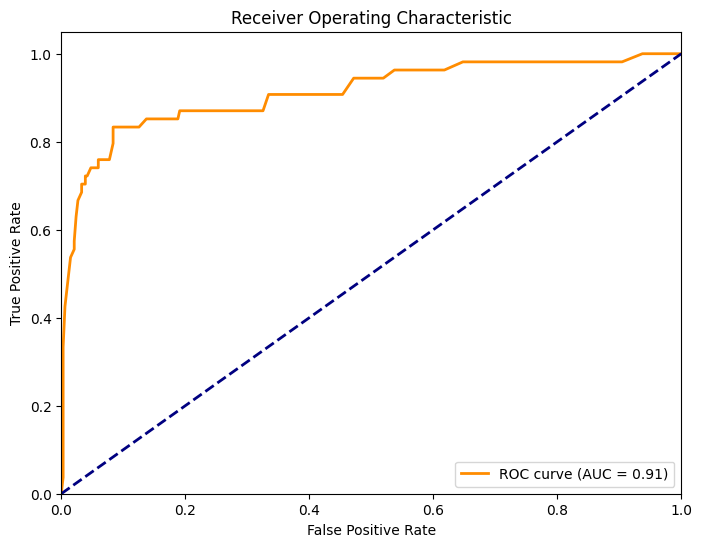

In [14]:
basic_model = CatBoostClassifier(
    random_state=42,
    verbose=0,
    iterations=1000,           
    depth=6,                  
    learning_rate=0.03,        
    l2_leaf_reg=3,             
    scale_pos_weight=1,        
    grow_policy='SymmetricTree',
    border_count=32            
)

param_grid = {
    'iterations': [50, 100, 200, 350, 500],      
    'depth': [4, 6, 8, 10],                 
    'learning_rate': [0.01, 0.03, 0.05, 0.1], 
    'l2_leaf_reg': [1, 3, 5],           
    'scale_pos_weight': [1, 3, 5],      
    'grow_policy': ['SymmetricTree', 'Depthwise'], 
    'border_count': [32, 64]            
}

stratification = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

best_model = find_best_model(
    model=basic_model,
    X_full_train=X_train,
    y_full_train=y_train,
    param_grid=param_grid,
    generate_dataset=generate_dataset,
    h3_indices_train=train_df['h3_index'],
)

train_model(
    best_model,
    X_full_train=X_train,
    y_full_train=y_train,
    stratification=stratification,
    generate_dataset=generate_dataset,
    h3_indices_train=train_df['h3_index'],
)

evaluate_model(
    best_model,
    X_test=X_test,
    y_test=y_test,
)

Fitting 5 folds for each of 48600 candidates, totalling 243000 fits


/Users/dmitrystarukhin/final_diploma_mipt_sumgf/diploma_env/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best parameters: {'colsample_bytree': 0.8, 'gamma': 0, 'learning_rate': 0.05, 'max_depth': 2, 'n_estimators': 100, 'reg_alpha': 0, 'reg_lambda': 1, 'scale_pos_weight': 3, 'subsample': 0.7}

Результаты полученные на валидационной выборке
precision = 0.6219178082191781
recall = 0.8376383763837638
f1 = 0.7138364779874214


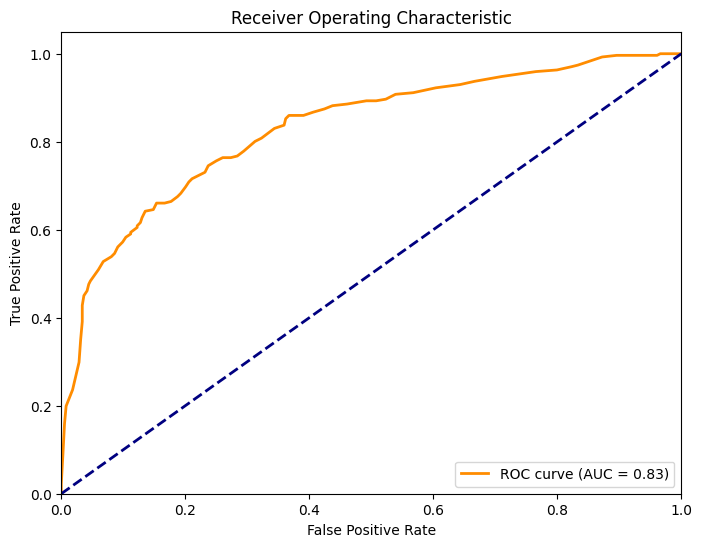

Результаты полученные на тестовой выборке
precision = 0.3137254901960784
recall = 0.8888888888888888
f1 = 0.46376811594202894


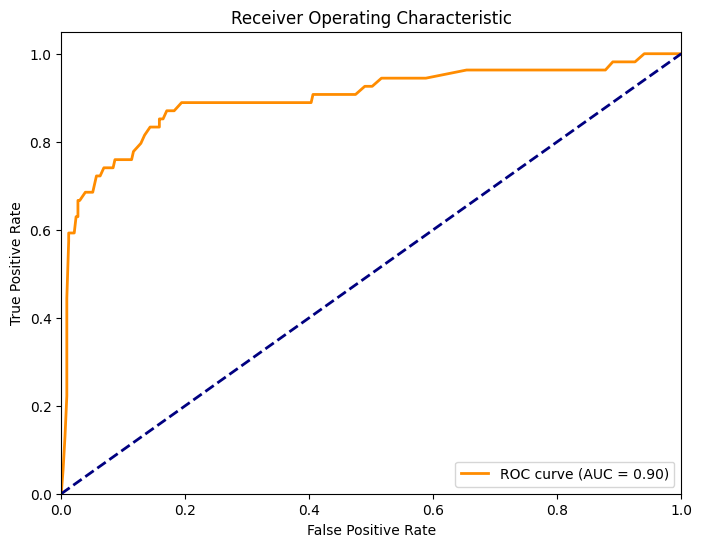

In [15]:
basic_model = XGBClassifier(
    random_state=42,
    eval_metric='logloss',
    n_estimators=100,          
    max_depth=6,              
    learning_rate=0.3,         
    subsample=1.0,             
    colsample_bytree=1.0,      
    scale_pos_weight=1,        
    gamma=0,                   
    reg_alpha=0,               
    reg_lambda=1               
)

param_grid = {
    'n_estimators': [50, 100, 200, 350, 500],   
    'max_depth': [2, 4, 6, 8, 10],             
    'learning_rate': [0.01, 0.05, 0.1, 0.3],  
    'subsample': [0.7, 0.8, 1.0],       
    'colsample_bytree': [0.7, 0.8, 1.0],
    'scale_pos_weight': [1, 3, 5],      
    'gamma': [0, 0.1, 0.2],             
    'reg_alpha': [0, 0.1],              
    'reg_lambda': [0, 0.1, 1]           
}

stratification = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

best_model = find_best_model(
    model=basic_model,
    X_full_train=X_train,
    y_full_train=y_train,
    param_grid=param_grid,
    generate_dataset=generate_dataset,
    h3_indices_train=train_df['h3_index'],
)

train_model(
    best_model,
    X_full_train=X_train,
    y_full_train=y_train,
    stratification=stratification,
    generate_dataset=generate_dataset,
    h3_indices_train=train_df['h3_index'],
)

evaluate_model(
    best_model,
    X_test=X_test,
    y_test=y_test,
)

Сейчас попробую обучить модели без агрегации

Fitting 5 folds for each of 12000 candidates, totalling 60000 fits
Best parameters: {'class_weight': 'balanced', 'max_depth': 15, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 200}

Результаты полученные на валидационной выборке
precision = 0.7235023041474654
recall = 0.5793357933579336
f1 = 0.6434426229508197


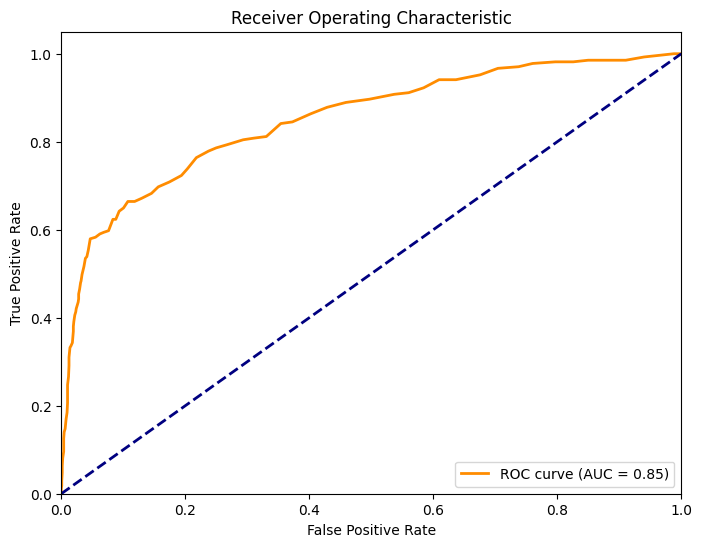

Результаты полученные на тестовой выборке
precision = 0.7307692307692307
recall = 0.7037037037037037
f1 = 0.7169811320754716


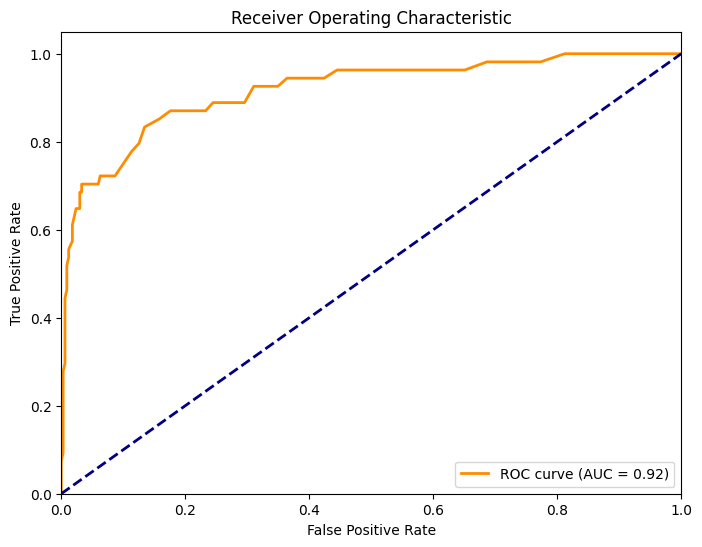

In [16]:
basic_model = RandomForestClassifier(
    random_state=42,
    n_estimators=100,          
    max_depth=None,            
    min_samples_split=2,       
    min_samples_leaf=1,       
    class_weight=None,         
    max_features='sqrt'       
)

param_grid = {
    'n_estimators': [3, 5, 10, 20, 50, 100, 200, 300, 400, 500],       
    'max_depth': [1, 5, 10, 15, 20, 25],       
    'min_samples_split': [2, 3, 5, 7, 10],   
    'min_samples_leaf': [1, 2, 3, 4],        
    'class_weight': ['balanced', None],   
    'max_features': ['sqrt', 0.5, 0.7, 0.8, 0.9]         
}

stratification = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

best_model = find_best_model(
    model=basic_model,
    X_full_train=X_train,
    y_full_train=y_train,
    param_grid=param_grid,
)

train_model(
    best_model,
    X_full_train=X_train,
    y_full_train=y_train,
    stratification=stratification
)

evaluate_model(
    best_model,
    X_test=X_test,
    y_test=y_test,
)

Fitting 5 folds for each of 2880 candidates, totalling 14400 fits


/Users/dmitrystarukhin/final_diploma_mipt_sumgf/diploma_env/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best parameters: {'border_count': 32, 'depth': 10, 'grow_policy': 'Depthwise', 'iterations': 100, 'l2_leaf_reg': 1, 'learning_rate': 0.1, 'scale_pos_weight': 5}

Результаты полученные на валидационной выборке
precision = 0.7183098591549296
recall = 0.5645756457564576
f1 = 0.6322314049586777


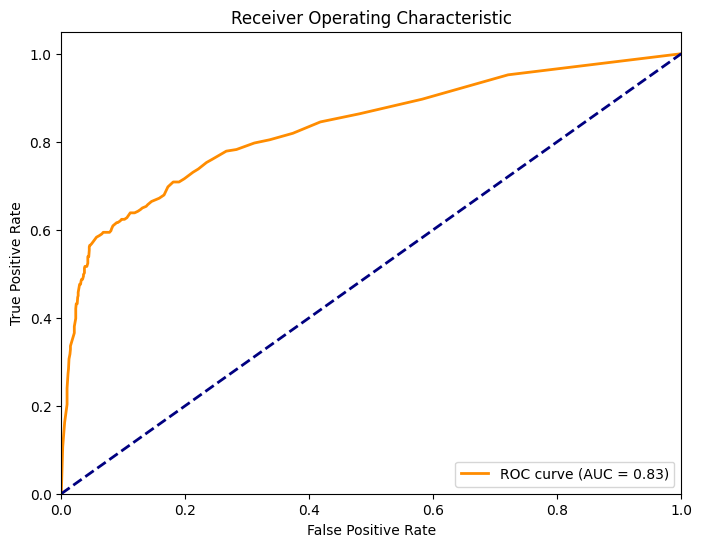

Результаты полученные на тестовой выборке
precision = 0.6
recall = 0.6666666666666666
f1 = 0.631578947368421


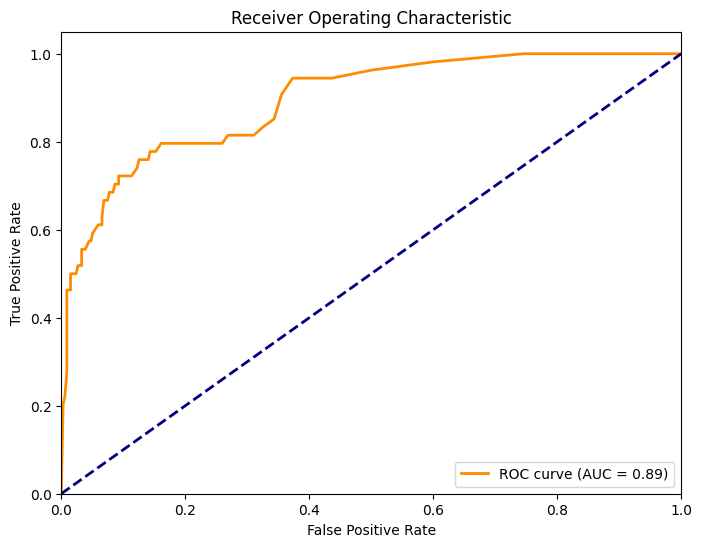

In [17]:
basic_model = CatBoostClassifier(
    random_state=42,
    verbose=0,
    iterations=1000,           
    depth=6,                  
    learning_rate=0.03,        
    l2_leaf_reg=3,             
    scale_pos_weight=1,        
    grow_policy='SymmetricTree',
    border_count=32            
)

param_grid = {
    'iterations': [50, 100, 200, 350, 500],      
    'depth': [4, 6, 8, 10],                 
    'learning_rate': [0.01, 0.03, 0.05, 0.1], 
    'l2_leaf_reg': [1, 3, 5],           
    'scale_pos_weight': [1, 3, 5],      
    'grow_policy': ['SymmetricTree', 'Depthwise'], 
    'border_count': [32, 64]            
}

stratification = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

best_model = find_best_model(
    model=basic_model,
    X_full_train=X_train,
    y_full_train=y_train,
    param_grid=param_grid,
)

train_model(
    best_model,
    X_full_train=X_train,
    y_full_train=y_train,
    stratification=stratification,
)

evaluate_model(
    best_model,
    X_test=X_test,
    y_test=y_test,
)

Fitting 5 folds for each of 48600 candidates, totalling 243000 fits


/Users/dmitrystarukhin/final_diploma_mipt_sumgf/diploma_env/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best parameters: {'colsample_bytree': 1.0, 'gamma': 0, 'learning_rate': 0.01, 'max_depth': 8, 'n_estimators': 500, 'reg_alpha': 0, 'reg_lambda': 1, 'scale_pos_weight': 5, 'subsample': 0.7}

Результаты полученные на валидационной выборке
precision = 0.7
recall = 0.6199261992619927
f1 = 0.6575342465753424


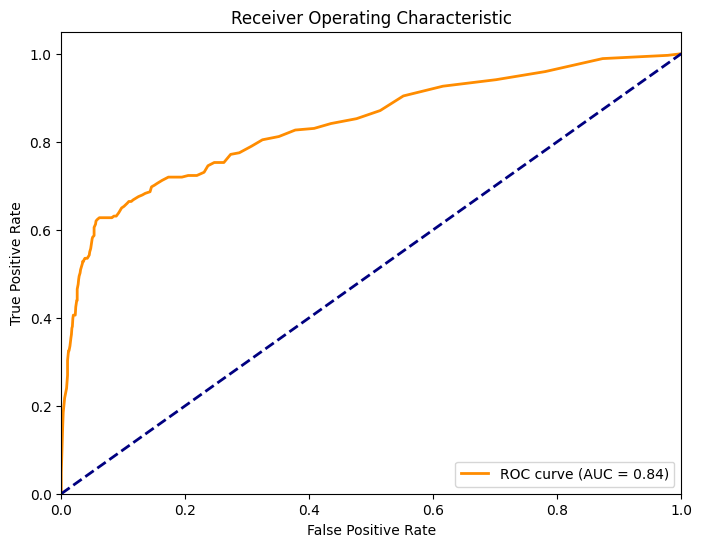

Результаты полученные на тестовой выборке
precision = 0.6666666666666666
recall = 0.7407407407407407
f1 = 0.7017543859649122


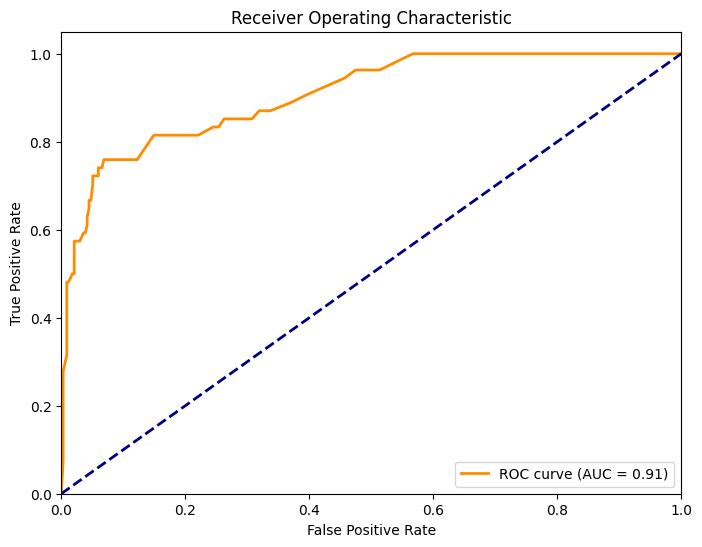

In [18]:
basic_model = XGBClassifier(
    random_state=42,
    eval_metric='logloss',
    n_estimators=100,          
    max_depth=6,              
    learning_rate=0.3,         
    subsample=1.0,             
    colsample_bytree=1.0,      
    scale_pos_weight=1,        
    gamma=0,                   
    reg_alpha=0,               
    reg_lambda=1               
)

param_grid = {
    'n_estimators': [50, 100, 200, 350, 500],   
    'max_depth': [2, 4, 6, 8, 10],             
    'learning_rate': [0.01, 0.05, 0.1, 0.3],  
    'subsample': [0.7, 0.8, 1.0],       
    'colsample_bytree': [0.7, 0.8, 1.0],
    'scale_pos_weight': [1, 3, 5],      
    'gamma': [0, 0.1, 0.2],             
    'reg_alpha': [0, 0.1],              
    'reg_lambda': [0, 0.1, 1]           
}

stratification = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

best_model = find_best_model(
    model=basic_model,
    X_full_train=X_train,
    y_full_train=y_train,
    param_grid=param_grid
)

train_model(
    best_model,
    X_full_train=X_train,
    y_full_train=y_train,
    stratification=stratification
)

evaluate_model(
    best_model,
    X_test=X_test,
    y_test=y_test,
)

In [19]:
from sklearn.ensemble import StackingClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression

Результаты полученные на валидационной выборке
precision = 0.7602339181286549
recall = 0.4797047970479705
f1 = 0.588235294117647


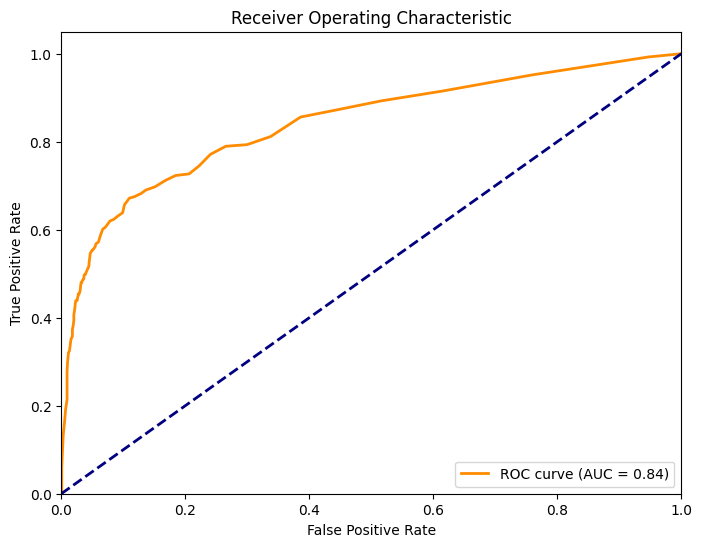

Результаты полученные на тестовой выборке
precision = 0.8043478260869565
recall = 0.6851851851851852
f1 = 0.74


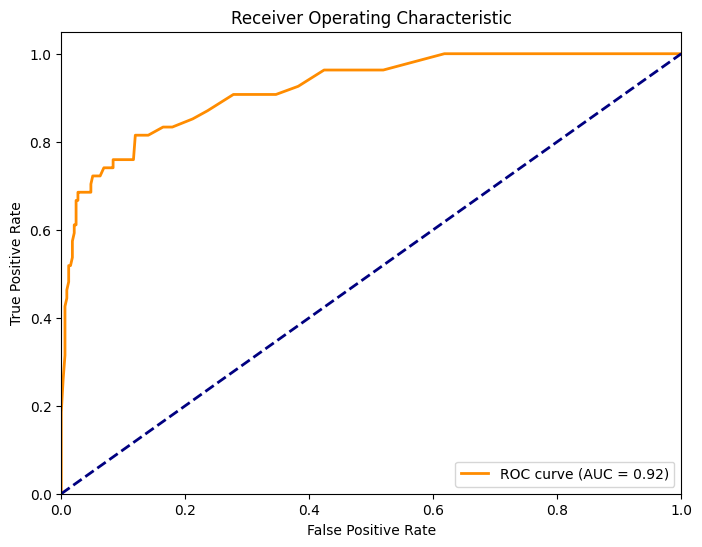

In [20]:
xgb_model = XGBClassifier(
    random_state=42,
    eval_metric='logloss',
    n_estimators=50,          
    max_depth=4,              
    learning_rate=0.1,         
    subsample=0.8,             
    colsample_bytree=0.8,      
    scale_pos_weight=3,        
    gamma=0.1,                   
    reg_alpha=0.1,               
    reg_lambda= 1               
)
catboost_model = CatBoostClassifier(
    random_state=42,
    verbose=0,
    iterations=500,           
    depth=8,                  
    learning_rate=0.01,        
    l2_leaf_reg=3,             
    scale_pos_weight=5,        
    grow_policy='SymmetricTree',
    border_count=64            
)
random_forest_model = RandomForestClassifier(
    random_state=42,
    n_estimators=20,          
    max_depth=15,            
    min_samples_split=2,       
    min_samples_leaf=4,       
    class_weight='balanced',         
    max_features=0.5       
)
estimators = [
    ('rf', random_forest_model),
    ('xgb', xgb_model),
    ('cat', catboost_model)
]

stacking_clf = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression())
train_model(
    stacking_clf,
    X_full_train=X_train,
    y_full_train=y_train,
    stratification=stratification
)

evaluate_model(
    stacking_clf,
    X_test=X_test,
    y_test=y_test,
)

Результаты полученные на валидационной выборке
precision = 0.7542857142857143
recall = 0.4870848708487085
f1 = 0.5919282511210763


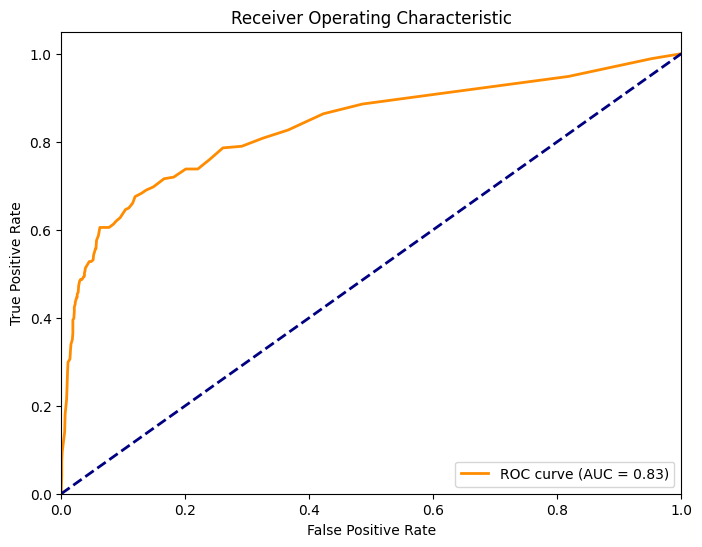

Результаты полученные на тестовой выборке
precision = 0.7346938775510204
recall = 0.6666666666666666
f1 = 0.6990291262135923


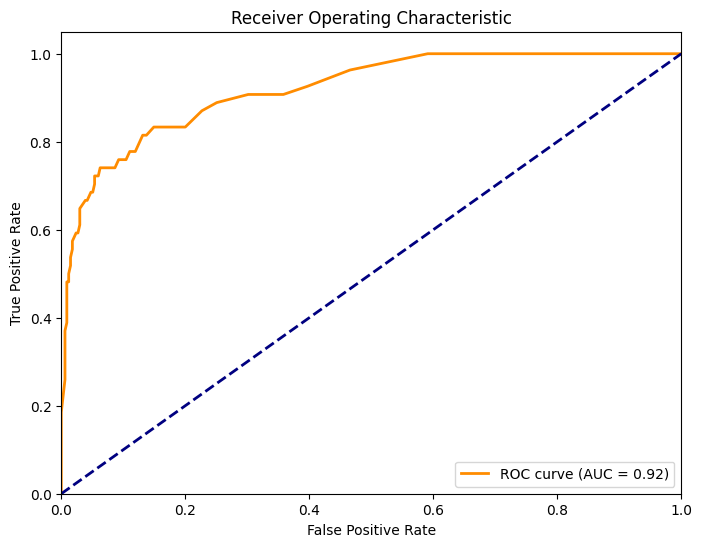

In [21]:
from sklearn.neural_network import MLPClassifier

stacking_clf = StackingClassifier(
    estimators=estimators,
    final_estimator=MLPClassifier(hidden_layer_sizes=(64,), max_iter=500),
)

train_model(
    stacking_clf,
    X_full_train=X_train,
    y_full_train=y_train,
    stratification=stratification
)

evaluate_model(
    stacking_clf,
    X_test=X_test,
    y_test=y_test,
)

Результаты полученные на валидационной выборке
precision = 0.6666666666666666
recall = 0.5904059040590406
f1 = 0.6262230919765167


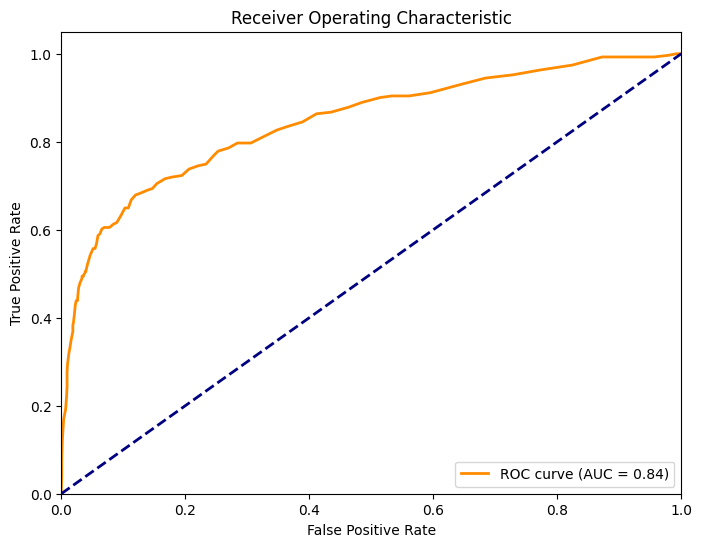

Результаты полученные на тестовой выборке
precision = 0.65
recall = 0.7222222222222222
f1 = 0.6842105263157895


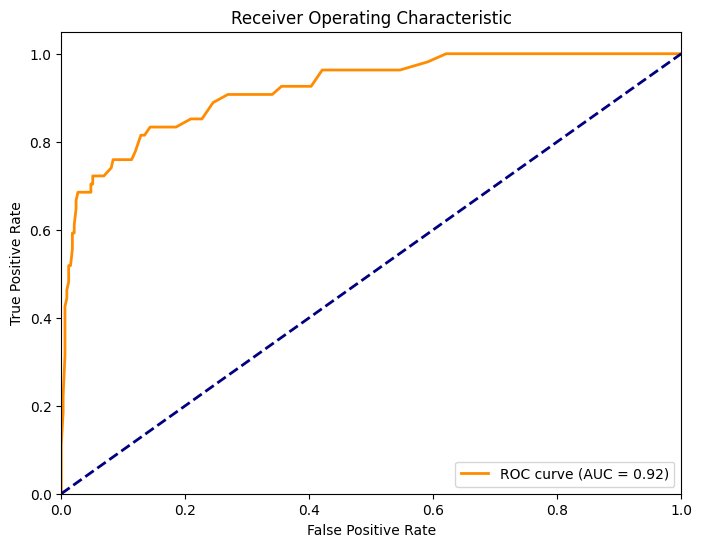

In [22]:
voting_clf = VotingClassifier(
    estimators=estimators,
    voting='soft',
)
train_model(
    voting_clf,
    X_full_train=X_train,
    y_full_train=y_train,
    stratification=stratification
)

evaluate_model(
    voting_clf,
    X_test=X_test,
    y_test=y_test,
)

Результаты полученные на валидационной выборке
precision = 0.6898148148148148
recall = 0.5498154981549815
f1 = 0.6119096509240246


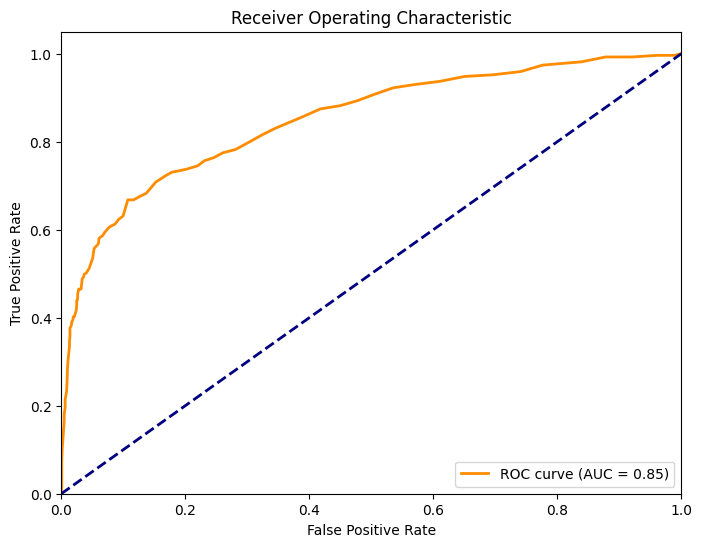

Результаты полученные на тестовой выборке
precision = 0.7169811320754716
recall = 0.7037037037037037
f1 = 0.7102803738317758


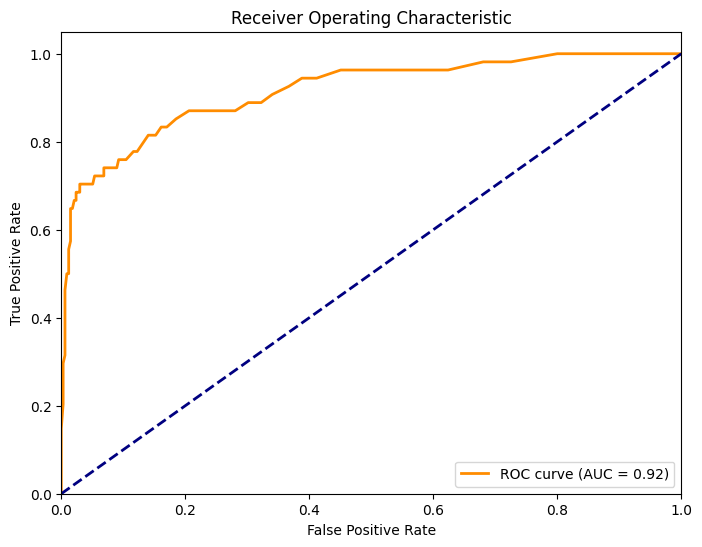

In [23]:
from sklearn.ensemble import BaggingClassifier

bagging_clf = BaggingClassifier(
    estimator=VotingClassifier(estimators=estimators, voting='soft'),
    n_estimators=10,
    random_state=42,
    max_samples=0.8,
    bootstrap=True
)

train_model(bagging_clf, X_train, y_train, stratification)
evaluate_model(bagging_clf, X_test, y_test)

сделаем обучение на нескольих эпохах (под одной эпохой тут я понимаю обучение на одном датасете из первой част (когда мы выкидываем соседей), здесь я делаю обучение на нескольких таких датасетах (6. Взял исходя из смысла что у каждой точчки по 6 соседей))

In [27]:
from sklearn.metrics import f1_score

In [38]:
def generate_epoch_datasets(X, y, h3_indices, n_epochs=6):
    X = X.reset_index(drop=True).copy()
    y = y.reset_index(drop=True).copy()
    h3_indices = h3_indices.reset_index(drop=True).copy()
    
    datasets = []
    
    for _ in range(n_epochs):
        selected_indices = []
        remaining_indices = set(range(len(X)))
        
        while remaining_indices:
            idx = np.random.choice(list(remaining_indices))
            selected_indices.append(idx)
            
            current_h3 = h3_indices.iloc[idx]
            neighbors = []
            for i in remaining_indices:
                if (h3_indices.iloc[i] in get_hex_neighbors(current_h3)) and (y.iloc[i] == 0):
                    neighbors.append(i)
                    
            remaining_indices -= {idx, *neighbors}
        
        X_epoch = X.iloc[selected_indices]
        y_epoch = y.iloc[selected_indices]
        datasets.append((X_epoch, y_epoch))
    
    return datasets

def find_best_model(
    model,
    X_full_train,
    y_full_train,
    param_grid,
    generate_dataset=None,
    h3_indices_train=None,
    n_epochs=6
):
    if generate_dataset:
        datasets = generate_epoch_datasets(X_full_train, y_full_train, h3_indices_train, n_epochs)
                
        keys, values = zip(*param_grid.items())
        param_combinations = [dict(zip(keys, v)) for v in product(*values)]
        
        best_score = -1
        best_model = None
        best_params = None

        for params in param_combinations:
            model_clone = clone(model)
            model_clone.set_params(**params)
            if 'max_iter' in model_clone.get_params():
                model_clone.set_params(max_iter=max_iter)
            
            for X_epoch, y_epoch in datasets:
                all_y_true = []
                all_y_pred = []
                skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
                
                for train_idx, val_idx in skf.split(X_epoch, y_epoch):
                    X_tr, X_val = X_epoch.iloc[train_idx], X_epoch.iloc[val_idx]
                    y_tr, y_val = y_epoch.iloc[train_idx], y_epoch.iloc[val_idx]
                    
                    model_clone.fit(X_tr, y_tr)
                    
                    y_pred = model_clone.predict(X_val)
                    y_proba = model_clone.predict_proba(X_val)[:, 1]

                    all_y_true.extend(y_val)
                    all_y_pred.extend(y_pred)

                    precision, recall, f1 = micro_averaged_metrics(np.array(all_y_true), np.array(all_y_pred))

                    if f1 > best_score:
                        best_score = f1
                        best_model = clone(model_clone)
                        best_params = params
        
        print(f"Best parameters: {best_params}")
        print()
        return best_model
    else:
        X_train, y_train = X_full_train, y_full_train
        
        skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
        
        grid_search = GridSearchCV(
            model,
            param_grid,
            cv=skf,
            scoring='f1',
            n_jobs=-1,
            verbose=1
        )
        grid_search.fit(X_train, y_train)
        best_model = clone(grid_search.best_estimator_)
        print(f"Best parameters: {grid_search.best_params_}")
        print()
        return best_model
    
def train_model(
    model,
    X_full_train,
    y_full_train,
    stratification,
    generate_dataset=None,
    h3_indices_train=None,
    n_epochs=6,
):
    if generate_dataset:
        best_score = -1
        best_model = None

        all_y_true_best = []
        all_y_pred_best = []
        all_y_proba_best = []
        
        
        datasets = generate_epoch_datasets(X_full_train, y_full_train, h3_indices_train, n_epochs)
        
        all_y_true = []
        all_y_pred = []
        all_y_proba = []
        
        for epoch, (X_epoch, y_epoch) in enumerate(datasets):
            
            skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
            
            for train_idx, val_idx in skf.split(X_epoch, y_epoch):
                X_tr, X_val = X_epoch.iloc[train_idx], X_epoch.iloc[val_idx]
                y_tr, y_val = y_epoch.iloc[train_idx], y_epoch.iloc[val_idx]
                
                model.fit(X_tr, y_tr)
                
                y_pred = model.predict(X_val)
                y_proba = model.predict_proba(X_val)[:, 1]
                
                all_y_true.extend(y_val)
                all_y_pred.extend(y_pred)
                all_y_proba.extend(y_proba)
            
            precision, recall, f1 = micro_averaged_metrics(np.array(all_y_true), np.array(all_y_pred))
            if f1 > best_score:
                best_score = f1
                best_model = copy.deepcopy(model)
                all_y_true_best = all_y_true
                all_y_pred_best = all_y_pred
                all_y_proba_best = all_y_proba
                print(f"Новый лучший результат! Сохраняем модель эпохи {epoch}")
                
            print(f"epoch:{epoch}, f1: {f1}")
        
        print('Результаты полученные на валидационной выборке')
        get_report(np.array(all_y_true_best), np.array(all_y_pred_best), np.array(all_y_proba_best))
        return best_model
        
    else:
        X_train, y_train = X_full_train, y_full_train
        
        skf = stratification
        all_y_true = []
        all_y_pred = []
        all_y_proba = []

        for train_idx, val_idx in skf.split(X_train, y_train):
            X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
            
            model.fit(X_tr, y_tr)
            
            y_pred = model.predict(X_val)
            y_proba = model.predict_proba(X_val)[:, 1]
            
            all_y_true.extend(y_val)
            all_y_pred.extend(y_pred)
            all_y_proba.extend(y_proba)
        
        print('Результаты полученные на валидационной выборке')
        get_report(np.array(all_y_true), np.array(all_y_pred), np.array(all_y_proba))
        
        return model

Новый лучший результат! Сохраняем модель эпохи 0
epoch:0, f1: 0.7339449541284403
epoch:1, f1: 0.7309833024118739
epoch:2, f1: 0.7191994996873045
epoch:3, f1: 0.7216203485633538
epoch:4, f1: 0.7207207207207207
epoch:5, f1: 0.7196495619524405
Результаты полученные на валидационной выборке
precision = 0.732484076433121
recall = 0.7072570725707257
f1 = 0.7196495619524405


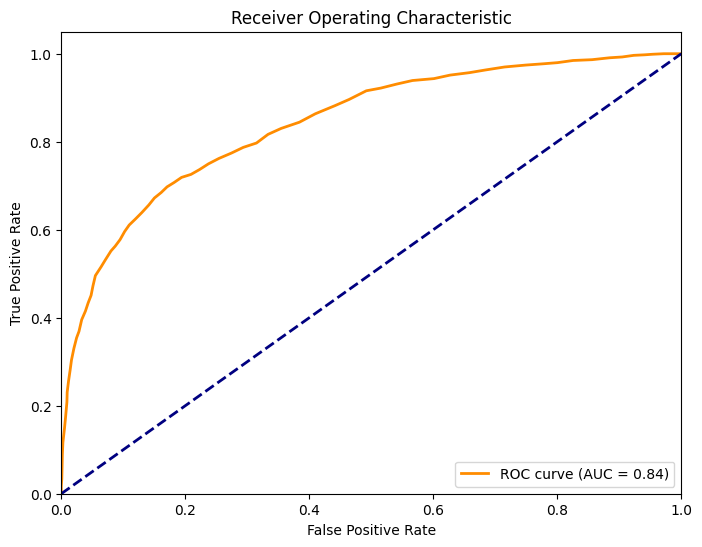

Результаты полученные на тестовой выборке
precision = 0.48863636363636365
recall = 0.7962962962962963
f1 = 0.6056338028169014


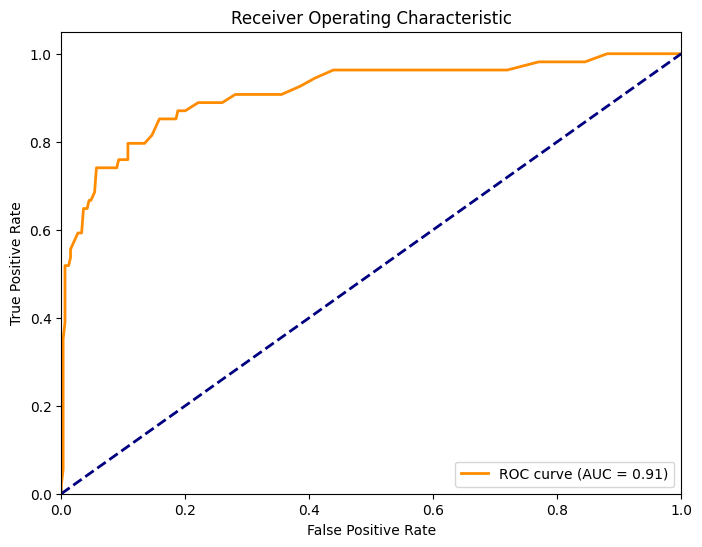

In [39]:
random_forest_model = RandomForestClassifier(
    random_state=42,
    n_estimators=200,          
    max_depth=15,            
    min_samples_split=2,       
    min_samples_leaf=10,       
    class_weight='balanced',         
    max_features='sqrt'       
)

stratification = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

train_model(
    random_forest_model,
    X_full_train=X_train,
    y_full_train=y_train,
    stratification=stratification,
    generate_dataset=generate_dataset,
    h3_indices_train=train_df['h3_index'],
)

evaluate_model(
    random_forest_model,
    X_test=X_test,
    y_test=y_test,
)

Новый лучший результат! Сохраняем модель эпохи 0
epoch:0, f1: 0.7005253940455342
epoch:1, f1: 0.688695652173913
epoch:2, f1: 0.6923963133640553
epoch:3, f1: 0.6997411561691114
Новый лучший результат! Сохраняем модель эпохи 4
epoch:4, f1: 0.7032436162870945
epoch:5, f1: 0.7019258407588387
Результаты полученные на валидационной выборке
precision = 0.6589314624932542
recall = 0.7509225092250923
f1 = 0.7019258407588387


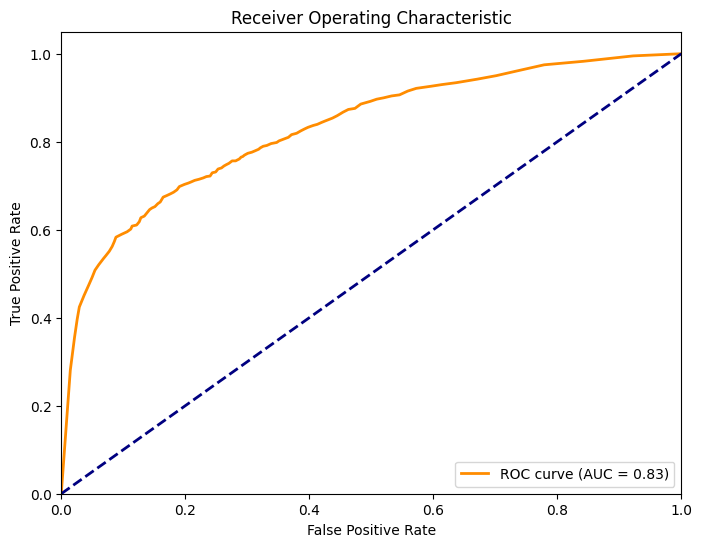

Результаты полученные на тестовой выборке
precision = 0.3357664233576642
recall = 0.8518518518518519
f1 = 0.4816753926701571


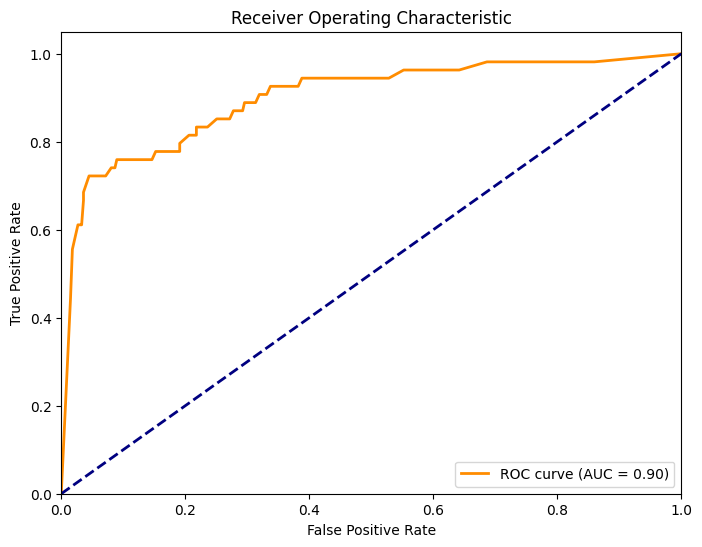

In [40]:
cat_boost_model = CatBoostClassifier(
    random_state=42,
    verbose=0,
    iterations=100,           
    depth=10,                  
    learning_rate=0.1,        
    l2_leaf_reg=1,             
    scale_pos_weight=5,        
    grow_policy='Depthwise',
    border_count=32            
)

stratification = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

train_model(
    cat_boost_model,
    X_full_train=X_train,
    y_full_train=y_train,
    stratification=stratification,
    generate_dataset=generate_dataset,
    h3_indices_train=train_df['h3_index'],
)

evaluate_model(
    cat_boost_model,
    X_test=X_test,
    y_test=y_test,
)

Новый лучший результат! Сохраняем модель эпохи 0
epoch:0, f1: 0.7074829931972789
epoch:1, f1: 0.7066779374471682
Новый лучший результат! Сохраняем модель эпохи 2
epoch:2, f1: 0.7076056338028168
epoch:3, f1: 0.7032040472175379
epoch:4, f1: 0.7029034436191763
epoch:5, f1: 0.704328274311411
Результаты полученные на валидационной выборке
precision = 0.6485507246376812
recall = 0.7706027060270603
f1 = 0.704328274311411


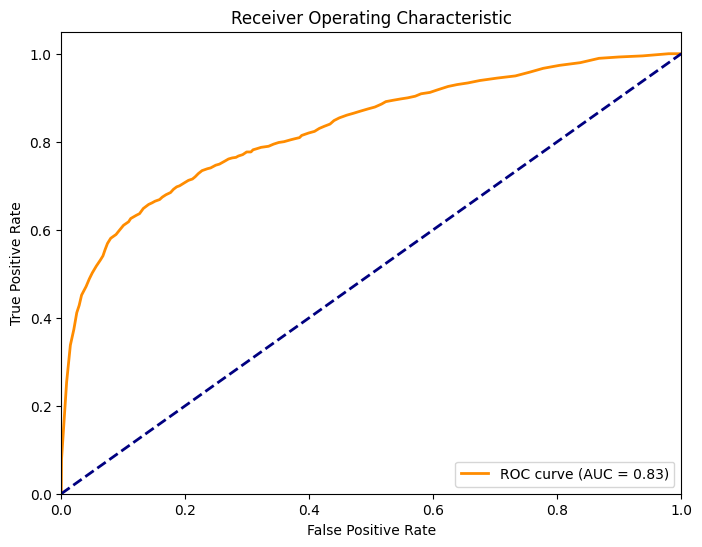

Результаты полученные на тестовой выборке
precision = 0.32432432432432434
recall = 0.8888888888888888
f1 = 0.4752475247524753


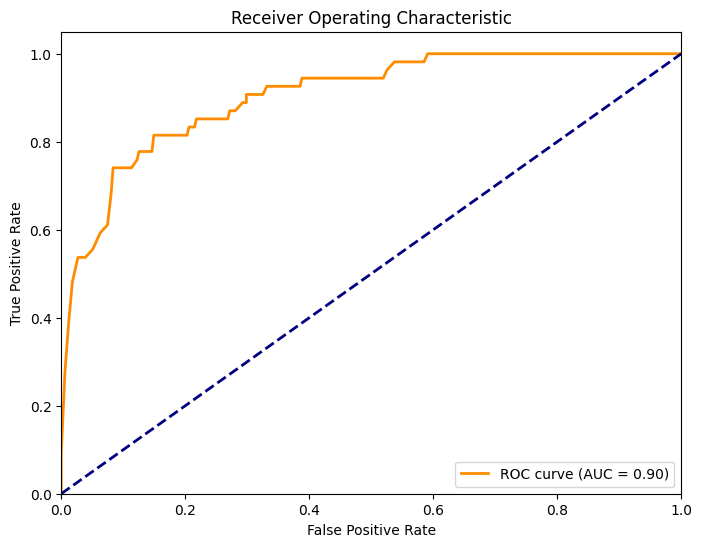

In [41]:
xgb_model = XGBClassifier(
    random_state=42,
    eval_metric='logloss',
    n_estimators=500,          
    max_depth=8,              
    learning_rate=0.01,         
    subsample=0.7,             
    colsample_bytree=1.0,      
    scale_pos_weight=5,        
    gamma=0,                   
    reg_alpha=0,               
    reg_lambda= 1               
)

train_model(
    xgb_model,
    X_full_train=X_train,
    y_full_train=y_train,
    stratification=stratification,
    generate_dataset=generate_dataset,
    h3_indices_train=train_df['h3_index'],
)

evaluate_model(
    xgb_model,
    X_test=X_test,
    y_test=y_test,
)

In [43]:
random_forest_model = RandomForestClassifier(
    random_state=42,
    n_estimators=200,          
    max_depth=15,            
    min_samples_split=2,       
    min_samples_leaf=10,       
    class_weight='balanced',         
    max_features='sqrt'       
)

cat_boost_model = CatBoostClassifier(
    random_state=42,
    verbose=0,
    iterations=100,           
    depth=10,                  
    learning_rate=0.1,        
    l2_leaf_reg=1,             
    scale_pos_weight=5,        
    grow_policy='Depthwise',
    border_count=32            
)

xgb_model = XGBClassifier(
    random_state=42,
    eval_metric='logloss',
    n_estimators=500,          
    max_depth=8,              
    learning_rate=0.01,         
    subsample=0.7,             
    colsample_bytree=1.0,      
    scale_pos_weight=5,        
    gamma=0,                   
    reg_alpha=0,               
    reg_lambda= 1               
)

stratification = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

estimators = [
    ('rf', random_forest_model),
    ('xgb', xgb_model),
    ('cat', catboost_model)
]

Новый лучший результат! Сохраняем модель эпохи 0
epoch:0, f1: 0.7058823529411764
Новый лучший результат! Сохраняем модель эпохи 1
epoch:1, f1: 0.71455938697318
epoch:2, f1: 0.7088122605363985
epoch:3, f1: 0.7086538461538462
epoch:4, f1: 0.7040185471406492
epoch:5, f1: 0.7085346215781
Результаты полученные на валидационной выборке
precision = 0.7437457741717377
recall = 0.6765067650676507
f1 = 0.7085346215781


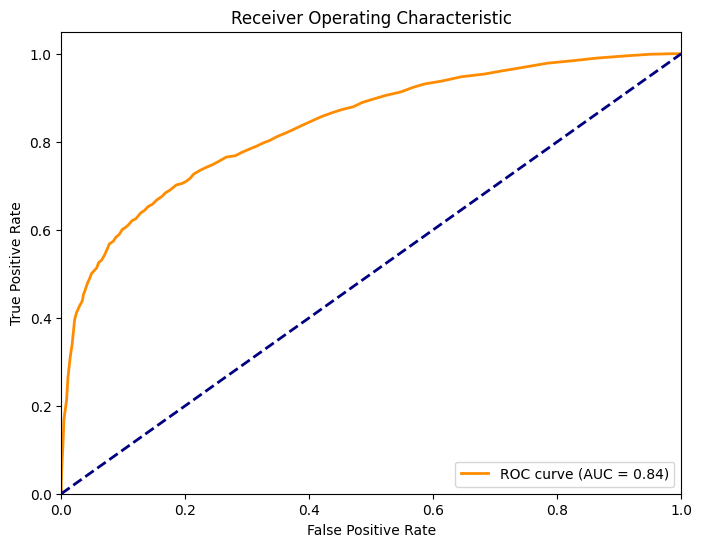

Результаты полученные на тестовой выборке
precision = 0.48484848484848486
recall = 0.8888888888888888
f1 = 0.6274509803921569


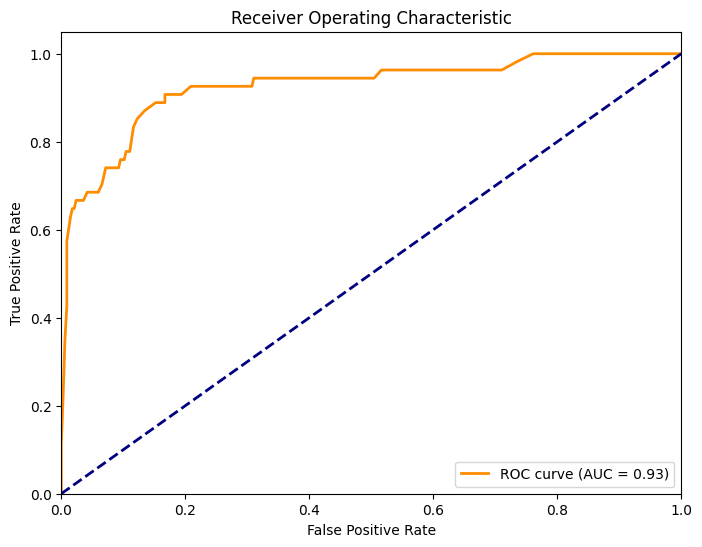

In [45]:
stacking_clf = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression())

train_model(
    stacking_clf,
    X_full_train=X_train,
    y_full_train=y_train,
    stratification=stratification,
    generate_dataset=generate_dataset,
    h3_indices_train=train_df['h3_index'],
)

evaluate_model(
    stacking_clf,
    X_test=X_test,
    y_test=y_test,
)

Новый лучший результат! Сохраняем модель эпохи 0
epoch:0, f1: 0.7089430894308943
Новый лучший результат! Сохраняем модель эпохи 1
epoch:1, f1: 0.7201309328968903
epoch:2, f1: 0.72
epoch:3, f1: 0.7132292522596548
epoch:4, f1: 0.7163982911600394
epoch:5, f1: 0.7147147147147147
Результаты полученные на валидационной выборке
precision = 0.6426116838487973
recall = 0.8050430504305043
f1 = 0.7147147147147147


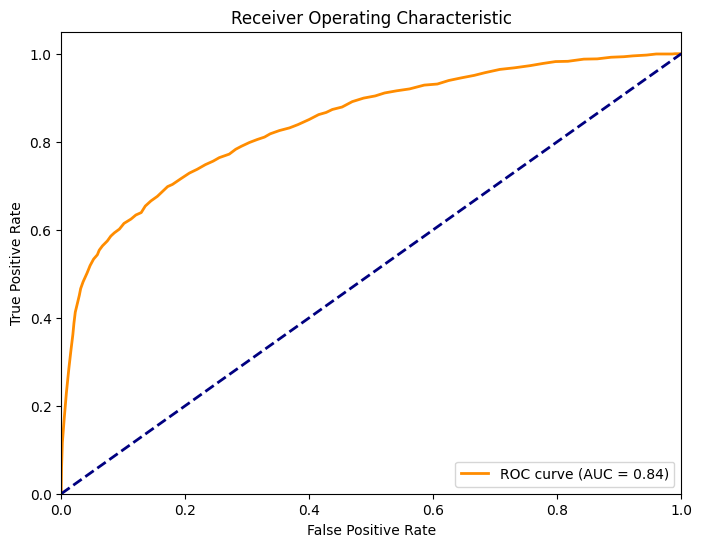

Результаты полученные на тестовой выборке
precision = 0.30718954248366015
recall = 0.8703703703703703
f1 = 0.45410628019323673


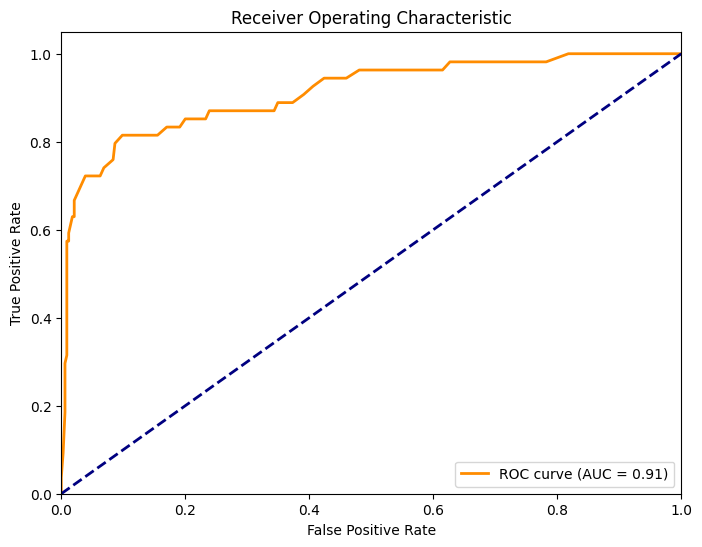

In [46]:
voting_clf = VotingClassifier(
    estimators=estimators,
    voting='soft',
)
train_model(
    voting_clf,
    X_full_train=X_train,
    y_full_train=y_train,
    stratification=stratification,
    generate_dataset=generate_dataset,
    h3_indices_train=train_df['h3_index'],
)

evaluate_model(
    voting_clf,
    X_test=X_test,
    y_test=y_test,
)

Новый лучший результат! Сохраняем модель эпохи 0
epoch:0, f1: 0.7205387205387205
Новый лучший результат! Сохраняем модель эпохи 1
epoch:1, f1: 0.7268128161888702
epoch:2, f1: 0.7213483146067416
Новый лучший результат! Сохраняем модель эпохи 3
epoch:3, f1: 0.726890756302521
epoch:4, f1: 0.724773717733825
epoch:5, f1: 0.7259467040673212
Результаты полученные на валидационной выборке
precision = 0.667354306343476
recall = 0.7958179581795818
f1 = 0.7259467040673212


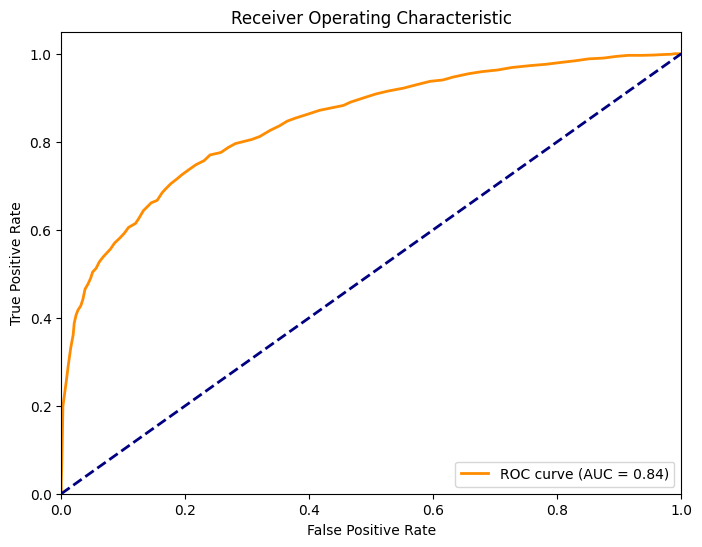

Результаты полученные на тестовой выборке
precision = 0.3356164383561644
recall = 0.9074074074074074
f1 = 0.49000000000000005


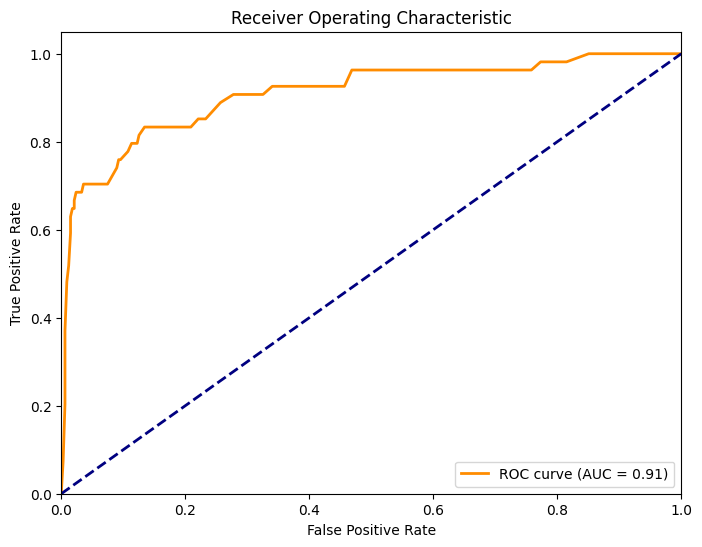

In [47]:
from sklearn.ensemble import BaggingClassifier

bagging_clf = BaggingClassifier(
    estimator=VotingClassifier(estimators=estimators, voting='soft'),
    n_estimators=10,
    random_state=42,
    max_samples=0.8,
    bootstrap=True
)

train_model(
    bagging_clf,
    X_full_train=X_train,
    y_full_train=y_train,
    stratification=stratification,
    generate_dataset=generate_dataset,
    h3_indices_train=train_df['h3_index'],
)

evaluate_model(
    bagging_clf,
    X_test=X_test,
    y_test=y_test,
)

далее обучение без учителя

In [232]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.decomposition import PCA

In [233]:
df.columns

Index(['h3_index', 'bicycle_amenities', 'bike_amenities', 'children_amenity',
       'food_amenities', 'health_amenity', 'home_amenities',
       'infrastructure_amenities', 'leisure_amenities', 'other_amenities',
       'pet_amenity', 'social_amenities', 'water_amenities', 'parking_area',
       'traffic_count', 'сharger_number', 'highway', 'public_transport',
       'railway', 'subway', 'voltage', 'distance_class', 'car_amenities',
       'needs_amenities', 'shops_amenities', 'work_amenity',
       'has_charging_station', 'usage_type', 'study_amenity', 'latitude',
       'longitude', 'distance_to_center'],
      dtype='object')

нужно ли удалить 'latitude', 'longitude'? как будто они тоже могут что-то сказать, типо в центре города kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(scaled_data)размещать - ок

In [234]:
data = df.drop(['сharger_number', 'has_charging_station', 'usage_type', 'h3_index'], axis=1) 

In [235]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data)

In [236]:
def plot_clusters_on_map(data, clusters, h3_index_col='h3_index', latitude_col='latitude', longitude_col='longitude'):
    pred_data = data.copy()
    pred_data['cluster'] = clusters

    if h3_index_col not in data.columns:
        pred_data[h3_index_col] = df[h3_index_col]
    if latitude_col not in data.columns:
        pred_data[latitude_col] = df[latitude_col]
        pred_data[longitude_col] = df[longitude_col]
    
    def rgb_to_hex(rgb):
        return "#{:02x}{:02x}{:02x}".format(int(rgb[0]*255), int(rgb[1]*255), int(rgb[2]*255))
    
    colors = [
            (0.9, 0.3, 0.3),  # Красный
            (0.1, 0.9, 0.1),  # Зеленый
            (0.1, 0.1, 0.9),  # Синий
            (0.5, 0.1, 0.9),  # Фиолетовый
            (0.3, 0.7, 0.7),  # Приглушенный бирюзовый
        ]
    tab20_hex = [rgb_to_hex(color) for color in colors]
    
    unique_clusters = sorted(pred_data['cluster'].unique())
    cluster_colors = {
        cluster: tab20_hex[i % len(tab20_hex)] 
        for i, cluster in enumerate(unique_clusters)
    }
    
    map_center = [pred_data[latitude_col].mean(), pred_data[longitude_col].mean()]
    m = folium.Map(location=map_center, zoom_start=12)
    
    def add_hexagon_to_map(row):
        hex_boundary = h3.cell_to_boundary(row['h3_index'])
        color = cluster_colors[row['cluster']]
        
        folium.Polygon(
            locations=hex_boundary,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            weight=1,
        ).add_to(m)
    
    pred_data.apply(add_hexagon_to_map, axis=1)
    
    return m

In [237]:
from sklearn.decomposition import PCA

def visualize_clusters_pca(scaled_data, clusters, algorithm_name="K-Means"):
    pca = PCA(n_components=2)
    principal_components = pca.fit_transform(scaled_data)
    
    plt.figure(figsize=(10, 6))
    scatter = plt.scatter(principal_components[:, 0], 
                         principal_components[:, 1], 
                         c=clusters, 
                         cmap='viridis',
                         alpha=0.7)
    
    plt.title(f'Кластеризация данных с помощью {algorithm_name}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.colorbar(scatter, label='Cluster')
    plt.grid(True, linestyle='--', alpha=0.5)
    
    plt.show()
    
    explained_variance = pca.explained_variance_ratio_
    print(f"Объясненная дисперсия компонент: {explained_variance}")
    print(f"Суммарная объясненная дисперсия: {sum(explained_variance):.2f}")

In [238]:
num_clusters = 2
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(scaled_data)

print("KMeans Metrics:")
print("Silhouette Score:", silhouette_score(scaled_data, clusters))
print("Calinski-Harabasz Index:", calinski_harabasz_score(scaled_data, clusters))
print("Davies-Bouldin Index:", davies_bouldin_score(scaled_data, clusters))

KMeans Metrics:
Silhouette Score: 0.5132314529068938
Calinski-Harabasz Index: 549.3555522226935
Davies-Bouldin Index: 1.5972800745322728


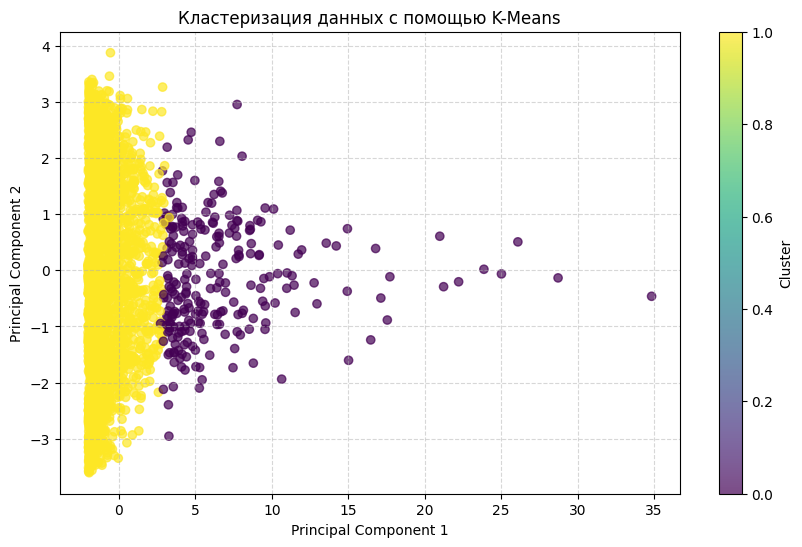

Объясненная дисперсия компонент: [0.2980446  0.10610581]
Суммарная объясненная дисперсия: 0.40


In [239]:
visualize_clusters_pca(scaled_data, clusters, algorithm_name="K-Means")

In [240]:
plot_clusters_on_map(data, clusters)

In [241]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=1.5, min_samples=10)
clusters = dbscan.fit_predict(scaled_data)

if len(set(clusters)) > 1:
    print("DBSCAN Metrics:")
    print("Silhouette Score:", silhouette_score(scaled_data, clusters))
    print("Calinski-Harabasz Index:", calinski_harabasz_score(scaled_data, clusters))
    print("Davies-Bouldin Index:", davies_bouldin_score(scaled_data, clusters))
else:
    print("DBSCAN выделил только один кластер — метрики не вычисляются.")


DBSCAN Metrics:
Silhouette Score: -0.15984201151246755
Calinski-Harabasz Index: 64.56550409791322
Davies-Bouldin Index: 2.1708349960557265


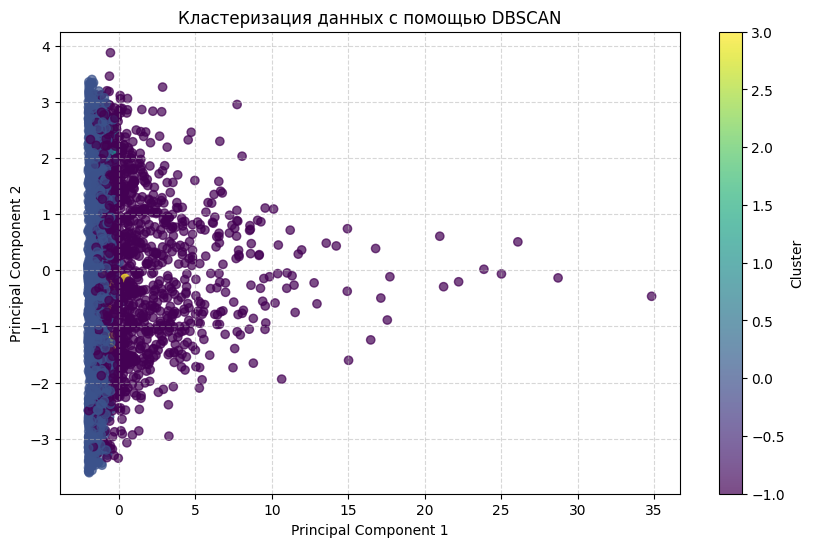

Объясненная дисперсия компонент: [0.2980446  0.10610581]
Суммарная объясненная дисперсия: 0.40


In [242]:
visualize_clusters_pca(scaled_data, clusters, algorithm_name="DBSCAN")

In [243]:
plot_clusters_on_map(data, clusters)

In [244]:
from sklearn.cluster import AgglomerativeClustering

agglo = AgglomerativeClustering(n_clusters=2)
clusters = agglo.fit_predict(scaled_data)

print("Agglomerative Clustering Metrics:")
print("Silhouette Score:", silhouette_score(scaled_data, clusters))
print("Calinski-Harabasz Index:", calinski_harabasz_score(scaled_data, clusters))
print("Davies-Bouldin Index:", davies_bouldin_score(scaled_data, clusters))


Agglomerative Clustering Metrics:
Silhouette Score: 0.5258126089505156
Calinski-Harabasz Index: 465.17850730526914
Davies-Bouldin Index: 1.6925812921180863


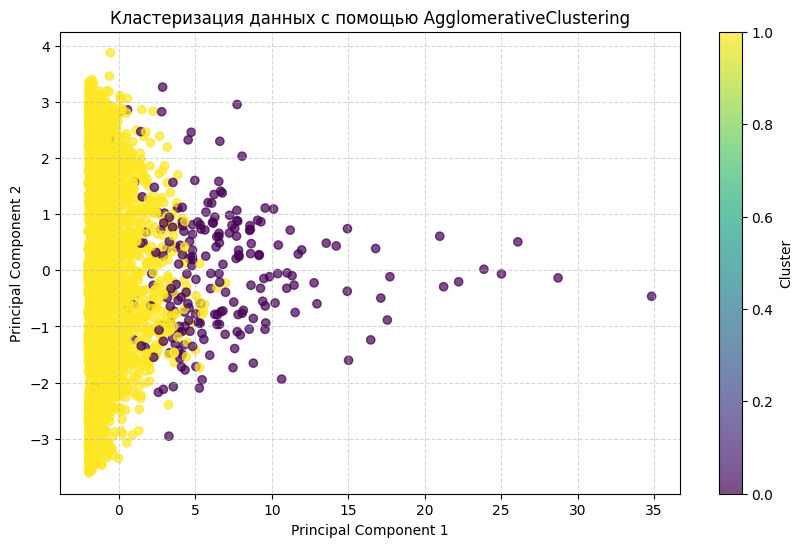

Объясненная дисперсия компонент: [0.2980446  0.10610581]
Суммарная объясненная дисперсия: 0.40


In [245]:
visualize_clusters_pca(scaled_data, clusters, algorithm_name="AgglomerativeClustering")

In [246]:
plot_clusters_on_map(data, clusters)

In [247]:
from sklearn.ensemble import IsolationForest

iso = IsolationForest(contamination=0.05, random_state=42)
clusters = iso.fit_predict(scaled_data)

print("Количество аномалий:", np.sum(clusters == -1))

Количество аномалий: 125


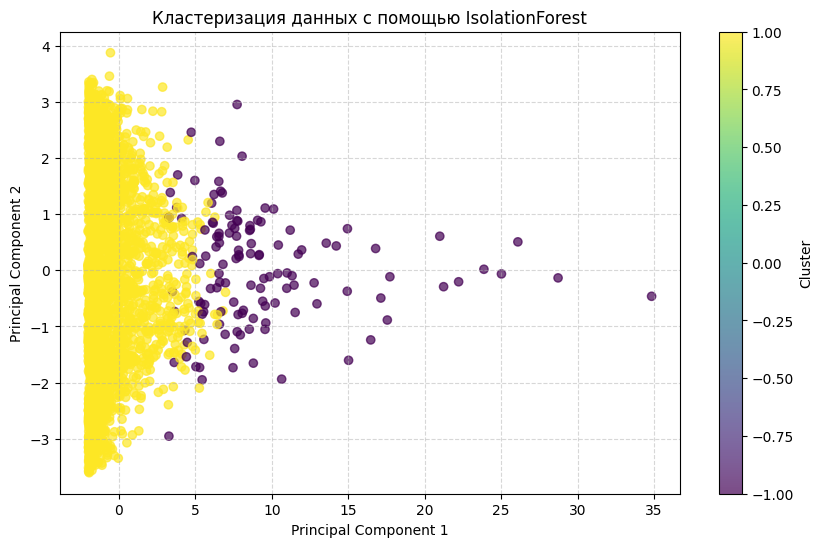

Объясненная дисперсия компонент: [0.2980446  0.10610581]
Суммарная объясненная дисперсия: 0.40


In [248]:
visualize_clusters_pca(scaled_data, clusters, algorithm_name="IsolationForest")

In [249]:
plot_clusters_on_map(data, clusters)